## **Загрузка необходимых библиотек и компонентов**

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm
import monai.transforms as transforms
from monai.data import DataLoader, Dataset, CacheDataset
from monai.utils import set_determinism
from glob import glob
import os
import numpy as np
from math import log2
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


## **Общие  новые слои**

In [4]:
"""Коэффициенты используются в критике и генераторе для определения того, насколько
каналы должны быть умножены и расширены для каждого слоя,
поэтому, в частности, для первых  слоев каналы остаются неизменными,
тогда как при увеличении img_size (по отношению к более поздним слоям)
мы уменьшаем количество каналов на 1/2, 1/4"""
factors = [1, 1, 1, 1, 1 / 2, 1 / 4, 1 / 8] # 7 коэфициентов для изображений до разрешения 256x256

In [5]:
class WSConv2d(nn.Module):

    def __init__(
        self, in_channels, out_channels, kernel_size=3, stride=1, padding=1, gain=2
    ):
        super(WSConv2d, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.scale = (gain / (in_channels * (kernel_size ** 2))) ** 0.5
        self.bias = self.conv.bias
        self.conv.bias = None

        # initialize conv layer
        nn.init.normal_(self.conv.weight)
        nn.init.zeros_(self.bias)

    def forward(self, x):
        return self.conv(x * self.scale) + self.bias.view(1, self.bias.shape[0], 1, 1)

class PixelNorm(nn.Module):
    def __init__(self):
        super(PixelNorm, self).__init__()
        self.epsilon = 1e-8

    def forward(self, x):
        return x / torch.sqrt(torch.mean(x ** 2, dim=1, keepdim=True) + self.epsilon)

In [6]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, use_pixelnorm=True):
        super(ConvBlock, self).__init__()
        self.use_pn = use_pixelnorm
        self.conv1 = WSConv2d(in_channels, out_channels)
        self.conv2 = WSConv2d(out_channels, out_channels)
        self.leaky = nn.LeakyReLU(0.2)
        self.pn = PixelNorm()

    def forward(self, x):
        x = self.leaky(self.conv1(x))
        x = self.pn(x) if self.use_pn else x
        x = self.leaky(self.conv2(x))
        x = self.pn(x) if self.use_pn else x
        return x

## **Модель генератора**

In [7]:
class Generator(nn.Module):
    def __init__(self, z_dim, in_channels, img_channels=3):
        super(Generator, self).__init__()
        # началльное преобразование 1x1 -> 4x4
        self.initial = nn.Sequential(
            PixelNorm(),
            nn.ConvTranspose2d(z_dim, in_channels, 4, 1, 0),
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2),
            PixelNorm(),
        )
        self.initial_rgb = WSConv2d(
            in_channels, img_channels, kernel_size=1, stride=1, padding=0
        )
        self.prog_blocks, self.rgb_layers = (
            nn.ModuleList([]),
            nn.ModuleList([self.initial_rgb]),
        )

        for i in range(len(factors) - 1):  # -1 чтобы предотвратить ошибку выхода индекса за пределы массива из-за factors[i+1]
            conv_in_c = int(in_channels * factors[i])
            conv_out_c = int(in_channels * factors[i + 1])
            self.prog_blocks.append(ConvBlock(conv_in_c, conv_out_c))
            self.rgb_layers.append(
                WSConv2d(conv_out_c, img_channels, kernel_size=1, stride=1, padding=0)
            )
    def fade_in(self, alpha, upscaled, generated):
        # alpha должно быть скалярным в пределах [0, 1], и upscale.shape == generated.shape
        return torch.tanh(alpha * generated + (1 - alpha) * upscaled)

    def forward(self, x, alpha, steps):
        out = self.initial(x)

        if steps == 0:
            return self.initial_rgb(out)

        for step in range(steps):
            upscaled = F.interpolate(out, scale_factor=2, mode="nearest")
            out = self.prog_blocks[step](upscaled)

        # Число каналов upscale Остаеться постоянным, в то время как при прохождение через prog_blocks оно может измениться. 
        # Поэтому мы пропускаем их через разные rgb_layers
        final_upscaled = self.rgb_layers[steps - 1](upscaled)
        final_out = self.rgb_layers[steps](out)
        return self.fade_in(alpha, final_upscaled, final_out)


## **Модель критика**

In [8]:
class Critic(nn.Module):
    def __init__(self, z_dim, in_channels, img_channels=3):
        super(Critic, self).__init__()
        self.prog_blocks, self.rgb_layers = nn.ModuleList([]), nn.ModuleList([])
        self.leaky = nn.LeakyReLU(0.2)

        # Мы идем в обратном направлении, потому что критик должен зеркално отражать генератор
        for i in range(len(factors) - 1, 0, -1):
            conv_in = int(in_channels * factors[i])
            conv_out = int(in_channels * factors[i - 1])
            self.prog_blocks.append(ConvBlock(conv_in, conv_out, use_pixelnorm=False))
            self.rgb_layers.append(
                WSConv2d(img_channels, conv_in, kernel_size=1, stride=1, padding=0)
            )


        self.initial_rgb = WSConv2d(
            img_channels, in_channels, kernel_size=1, stride=1, padding=0
        )
        self.rgb_layers.append(self.initial_rgb)
        self.avg_pool = nn.AvgPool2d(kernel_size=2, stride=2)  # avg pool используется для уменьшения изображения вдвое 

        # блок для изображения 4x4 
        self.final_block = nn.Sequential(
            # +1 к in_channels поскольку мы брибавляем слой MiniBatch std
            WSConv2d(in_channels + 1, in_channels, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, in_channels, kernel_size=4, padding=0, stride=1),
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, 1, kernel_size=1, padding=0, stride=1)
        )

    def fade_in(self, alpha, downscaled, out):
        return alpha * out + (1 - alpha) * downscaled

    def minibatch_std(self, x):
        batch_statistics = (
            torch.std(x, dim=0).mean().repeat(x.shape[0], 1, x.shape[2], x.shape[3])
        )

        return torch.cat([x, batch_statistics], dim=1)

    def forward(self, x, alpha, steps):

        cur_step = len(self.prog_blocks) - steps


        out = self.leaky(self.rgb_layers[cur_step](x))

        if steps == 0:  #image is 4x4
            out = self.minibatch_std(out)
            return self.final_block(out).view(out.shape[0], -1)


        downscaled = self.leaky(self.rgb_layers[cur_step + 1](self.avg_pool(x)))
        out = self.avg_pool(self.prog_blocks[cur_step](out))

        # в отличии от генератора fade_in выполняется сначала между уменьшенным масштабом и входом 
        out = self.fade_in(alpha, downscaled, out)

        for step in range(cur_step + 1, len(self.prog_blocks)):
            out = self.prog_blocks[step](out)
            out = self.avg_pool(out)

        out = self.minibatch_std(out)
        return self.final_block(out).view(out.shape[0], -1)

## **Градиентный штраф**

In [9]:
def gradient_penalty(critic, real, fake, alpha, train_step, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    beta = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1, C, H, W).to(device)
    interpolated_images = real * beta + fake.detach() * (1 - beta)
    interpolated_images.requires_grad_(True)
   
    mixed_scores = critic(interpolated_images, alpha, train_step)

    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

## **Функция для записи результата**

In [10]:
def plot_to_tensorboard(
    writer, loss_critic, loss_gen, real, fake, tensorboard_step
):
    writer.add_scalar("Loss Critic", loss_critic, global_step=tensorboard_step)

    with torch.no_grad():

        img_grid_real = torchvision.utils.make_grid(real[:16], normalize=True)
        img_grid_fake = torchvision.utils.make_grid(fake[:16], normalize=True)
        writer.add_image("Реальные изображения КТ грудной клетки", img_grid_real, global_step=tensorboard_step)
        writer.add_image("Сгенерированные изображения КТ грудной клетки", img_grid_fake, global_step=tensorboard_step)

## **Настройка гипперпараметров**

In [11]:
START_TRAIN_AT_IMG_SIZE = 4
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE = 1e-3
BATCH_SIZES = [64, 64, 32, 32, 16, 16, 8]
CHANNELS_IMG = 1
Z_DIM = 128  
IN_CHANNELS = 128  
CRITIC_ITERATIONS = 3
LAMBDA_GP = 10
PROGRESSIVE_EPOCHS = [30] * len(BATCH_SIZES)
FIXED_NOISE = torch.randn(16, Z_DIM, 1, 1).to(DEVICE)

## **Загрузка и трансформация изображений**

In [12]:
#Параметры трансформации
IN_DIR = "../data/patients_dcm"
PIX_DIM=(1.5, 1.5, 1)
A_MIN=-200
A_MAX=200
CACHE = False

In [13]:
def get_loader(in_dir = "../data/patients_dcm", pix_dim=(1.5, 1.5, 1), 
               a_min=-200, a_max=200, spartial_size = [256, 256, 1],
               batch_size = 32, cache = False):
    
    #Список трансофрмаций
    train_transforms = transforms.Compose(
          [
            transforms.LoadImaged(keys=["vol"],ensure_channel_first = True),
            transforms.Spacingd(keys=["vol"], pixdim=pix_dim, mode='bilinear'),
            transforms.Orientationd(keys="vol", axcodes="RAS"),
            transforms.ScaleIntensityRanged(keys=["vol"], a_min=a_min, a_max=a_max, b_min=0.0, b_max=1.0, clip=True), 
            transforms.Resized(keys=["vol"], spatial_size=spartial_size),
            transforms.Rotate90d(keys=["vol"]),
            transforms.ToTensord(keys=["vol"]),

          ]
      )

    #Получение путей файлов
    path_volumes = glob(in_dir + "\\patient_*\\*.dcm")
    train_files  = [{"vol": image_name} for image_name in zip(path_volumes)]

    #Инициализация датасета и загрузчика
    if cache:
        
        dataset = CacheDataset(data=train_files, transform=train_transforms, cache_rate=1.0)

    else:
        dataset = Dataset(data=train_files, transform=train_transforms)

    loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    return loader, dataset

## **Просмотр обработанных изображений**

In [12]:
import matplotlib.pyplot as plt
from monai.utils import first
%matplotlib inline 

In [14]:
#Получение батча из загрузчика
IMAGE_SIZE = 256
spartial_size = [256, 256, 1]
batch_size = 64
loader_ex, _ = get_loader(IN_DIR, PIX_DIM, A_MIN, A_MAX, spartial_size, batch_size,False)
view_train_patient = first(loader_ex)
print(view_train_patient["vol"].shape)
view_train_patient = view_train_patient["vol"]
view_train_patient = view_train_patient.reshape(64, 1, IMAGE_SIZE, IMAGE_SIZE)
print(view_train_patient.shape)

torch.Size([64, 1, 256, 256, 1])
torch.Size([64, 1, 256, 256])


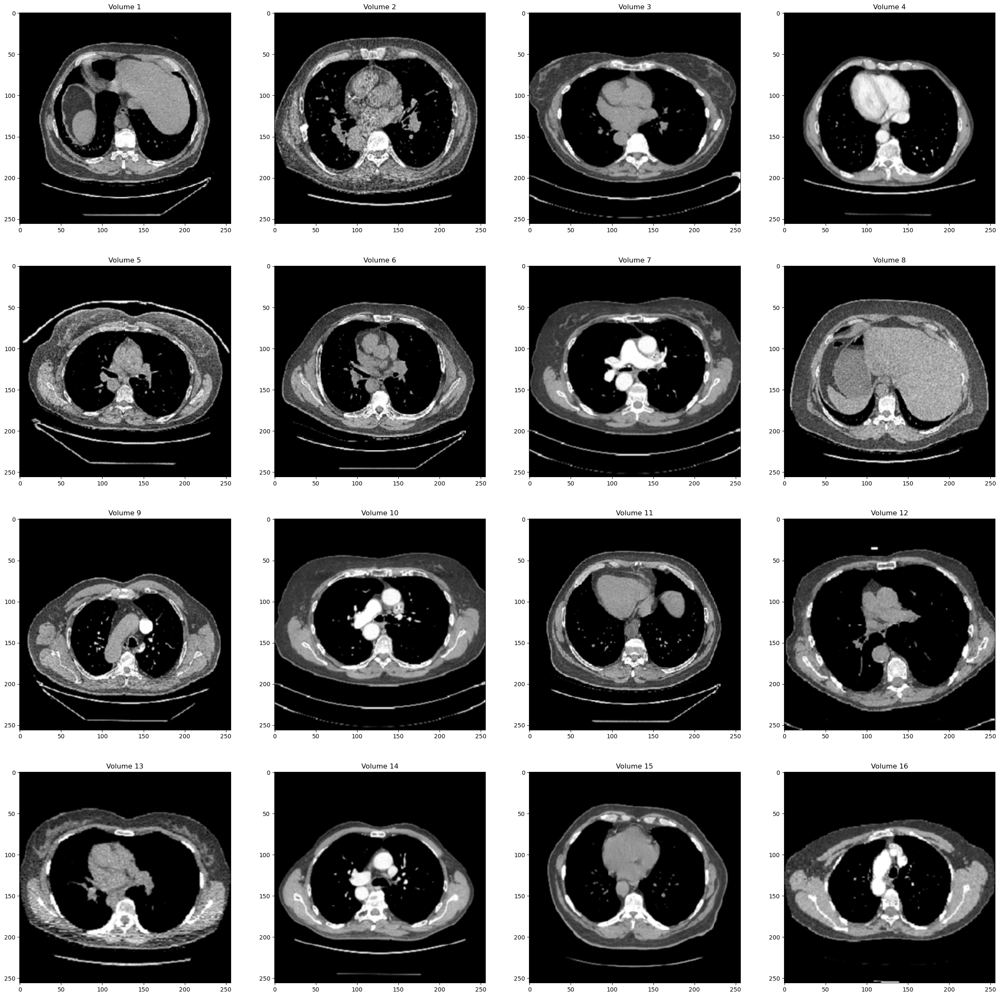

In [15]:
#Просмотр изображений
plt.figure("Visualization Train", (30, 30))

for i, image in enumerate(view_train_patient):    
      if i < 16:
        plt.subplot(4, 4, i+1)
        plt.title(f"Volume {i+1}")
        image = image[0, :, :]
        plt.imshow(image, cmap="gray")

## **Функция обучения нейросетей**

In [14]:
def train_fn(critic, gen, loader, dataset, step, alpha,opt_critic,opt_gen, tensorboard_step, writer,scaler_gen,scaler_critic,):
    loop = tqdm(loader, leave=True)
    for batch_idx, batch_data in enumerate(loop):
        real = batch_data["vol"]
        cur_batch_size = real.shape[0] # Получение размера текущего батча
        #print(real.shape)
        curent_image_size = 4 * 2 ** step # Получение текущего размера изображений
        real = real.reshape(cur_batch_size, 1, curent_image_size, curent_image_size)
        #print(real.shape)
        real = torch.tensor(real)
        real = real.to(DEVICE)
        
        # Тренировка Критика: max E[critic(real)] - E[critic(fake)] <-> min -E[critic(real)] + E[critic(fake)]
        noise = torch.randn(cur_batch_size, Z_DIM, 1, 1).to(DEVICE)
        
        with torch.cuda.amp.autocast():
            fake = gen(noise, alpha, step)
            critic_real = critic(real, alpha, step)
            critic_fake = critic(fake.detach(), alpha, step)
            gp = gradient_penalty(critic, real, fake, alpha, step, device=DEVICE)
            loss_critic = (
                -(torch.mean(critic_real) - torch.mean(critic_fake))
                + LAMBDA_GP * gp
                + (0.001 * torch.mean(critic_real ** 2))
            )
        
        # Обновление весов Критика
        opt_critic.zero_grad()
        scaler_critic.scale(loss_critic).backward()
        scaler_critic.step(opt_critic)
        scaler_critic.update()

        # Тренировка Генератора: max E[critic(gen_fake)] <-> min -E[critic(gen_fake)]
        with torch.cuda.amp.autocast():
            gen_fake = critic(fake, alpha, step)
            loss_gen = -torch.mean(gen_fake)
        
        # Обновление весов Генератора
        opt_gen.zero_grad()
        scaler_gen.scale(loss_gen).backward()
        scaler_gen.step(opt_gen)
        scaler_gen.update()

        # Обновление коэффициента alpha
        alpha += cur_batch_size / (
            (PROGRESSIVE_EPOCHS[step] * 0.5) * len(dataset)
        )
        alpha = min(alpha, 1)

        if batch_idx == 0:
                   
            with torch.no_grad():

                fixed_fakes = gen(FIXED_NOISE, alpha, step) * 0.5 + 0.5
                plot_to_tensorboard(
                  writer,
                  loss_critic.item(),
                  loss_gen.item(),
                  real.detach(),
                  fixed_fakes.detach(),
                  tensorboard_step,
              )
                tensorboard_step += 1
            
                     
        loop.set_postfix(
          gp=gp.item(),
          loss_critic=loss_critic.item(),
        )

    return tensorboard_step, alpha


## **Инициализация моделей**

In [15]:
# Инициализация Генератора и Критика
gen = Generator(
    Z_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG
).to(DEVICE)
critic = Critic(
    Z_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG
).to(DEVICE)

# Инициализация оптимизатора и скейлера training
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99))
opt_critic = optim.Adam(
    critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99)
)
scaler_critic = torch.cuda.amp.GradScaler()
scaler_gen = torch.cuda.amp.GradScaler()

# Сохранения результата работы
writer = SummaryWriter(f"logs1")


## **Main**

In [16]:
gen.train()
critic.train()

tensorboard_step = 0
# начальный шаг соответсвует заданному начальному изображению
step = int(log2(START_TRAIN_AT_IMG_SIZE / 4))
for num_epochs in PROGRESSIVE_EPOCHS[step:]:
    alpha = 1e-5
    curent_image_size = 4 * 2 ** step # 4->0, 8->1, 16->2, 32->3, 64 -> 4
    spartial_size = [curent_image_size, curent_image_size, 1]
    batch_size = BATCH_SIZES[step]
    loader, dataset = get_loader(IN_DIR, PIX_DIM, A_MIN, A_MAX, spartial_size, batch_size, CACHE)
    print(f"Current image size: {4 * 2 ** step}")

    for epoch in range(num_epochs):
        print(f"Epoch [{epoch+1}/{num_epochs}]")
        tensorboard_step, alpha = train_fn(critic, gen, loader, dataset, 
                                           step, alpha, opt_critic, 
                                           opt_gen, tensorboard_step, writer, 
                                           scaler_gen, scaler_critic, )
        
    #Сохранение весов моделей критика и генератора
    torch.save(critic.state_dict(), f"../model/progan_monai{curent_image_size}_critic")
    torch.save(gen.state_dict(), f"../model/progan_monai{curent_image_size}_gen")

    step += 1  # отслеживание прогресса для размера изображения

Current image size: 4
Epoch [1/30]


100%|██████████| 170/170 [03:56<00:00,  1.39s/it, gp=0.0194, loss_critic=-.363] 


Epoch [2/30]


100%|██████████| 170/170 [02:53<00:00,  1.02s/it, gp=0.00916, loss_critic=-.11]  


Epoch [3/30]


 81%|████████  | 137/170 [02:19<00:33,  1.02s/it, gp=0.00671, loss_critic=-.0503] 


KeyboardInterrupt: 

In [15]:
#Сохранение весов моделей критика и генератора
torch.save(critic.state_dict(), f"../model/progan_monai256_critic")
torch.save(gen.state_dict(), "../model/progan_monai256_gen")

## **Просмортр результата**

In [23]:
!kill 15456

kill: 15456: No such process


In [2]:
#%reload_ext tensorboard
%tensorboard --logdir logs_cprogan

Reusing TensorBoard on port 6006 (pid 17268), started 0:04:43 ago. (Use '!kill 17268' to kill it.)